## PIMA diabetes Exploratory Data Analysis

In [1]:
using Pkg
Pkg.activate("../")

  Activating project at `~/Coding/machine-learning-julia`


In [2]:
using CSV
using DataFrames
using HTTP
using PlotlyJS
using FreqTables
using StatsBase
using Statistics
using VegaLite
# using StatsPlots
Pkg.status()

Status 

`~/Coding/machine-learning-julia/Project.toml`


  [336ed68f] CSV v0.10.4
  [8f4d0f93] Conda v1.7.0
  [a93c6f00] DataFrames v1.4.1
  [da1fdf0e] FreqTables v0.4.5
⌅ [cd3eb016] HTTP v0.9.17
  [7073ff75] IJulia v1.23.3
  [add582a8] MLJ v0.18.5
  [f0f68f2c] PlotlyJS v0.18.10
  [2913bbd2] StatsBase v0.33.21
  [f3b207a7] StatsPlots v0.15.4
  [112f6efa] VegaLite v2.6.0
Info Packages marked with ⌅ have new versions available but compatibility constraints restrict them from upgrading. To see why use `status --outdated`


In [3]:
PlotlyJS.templates

Templates configuration
-----------------------
Default template: plotly
Available templates: [:presentation, :plotly_dark, :ggplot2, :plotly, :seaborn, :ygridoff, :plotly_white, :simple_white, :xgridoff, :gridon]



In [4]:
ENV["COLUMNS"]=120

120

In [5]:
url = "https://raw.githubusercontent.com/jameshtwose/example_deliverables/main/classification_examples/pima_diabetes/diabetes.csv"
df = DataFrame(CSV.File(HTTP.get(url).body));
df.index = range(1, size(df)[1])

1:768

In [6]:
df[!, 1: end-2] = mapcols!(ByRow(Float64), df[!, 1: end-2]);

In [7]:
first(df, 3)

Row,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,index
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Int64
1,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0,1,1
2,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0,0,2
3,8.0,183.0,64.0,0.0,0.0,23.3,0.672,32.0,1,3


In [8]:
size(df)

(768, 10)

In [9]:
describe(df, :all)

Row,variable,mean,std,min,q25,median,q75,max,nunique,nuniqueall,nmissing,nnonmissing,first,last,eltype
,Symbol,Float64,Float64,Real,Float64,Float64,Float64,Real,Nothing,Int64,Int64,Int64,Real,Real,DataType
1,Pregnancies,3.84505,3.36958,0.0,1.0,3.0,6.0,17.0,,17,0,768,6.0,1.0,Float64
2,Glucose,120.895,31.9726,0.0,99.0,117.0,140.25,199.0,,136,0,768,148.0,93.0,Float64
3,BloodPressure,69.1055,19.3558,0.0,62.0,72.0,80.0,122.0,,47,0,768,72.0,70.0,Float64
4,SkinThickness,20.5365,15.9522,0.0,0.0,23.0,32.0,99.0,,51,0,768,35.0,31.0,Float64
5,Insulin,79.7995,115.244,0.0,0.0,30.5,127.25,846.0,,186,0,768,0.0,0.0,Float64
6,BMI,31.9926,7.88416,0.0,27.3,32.0,36.6,67.1,,248,0,768,33.6,30.4,Float64
7,DiabetesPedigreeFunction,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42,,517,0,768,0.627,0.315,Float64
8,Age,33.2409,11.7602,21.0,24.0,29.0,41.0,81.0,,52,0,768,50.0,23.0,Float64
9,Outcome,0.348958,0.476951,0,0.0,0.0,1.0,1,,2,0,768,1,0,Int64


### Plot the amount of rows in each side of the target
#### Looks like the target is imbalanced so this needs to be taken into account

In [10]:
target="Outcome";

In [11]:
ft = freqtable(df, target)
plot_df = DataFrame(target = names(ft)[1], Freq = ft)

Row,target,Freq
,Int64,Int64
1,0,500
2,1,268


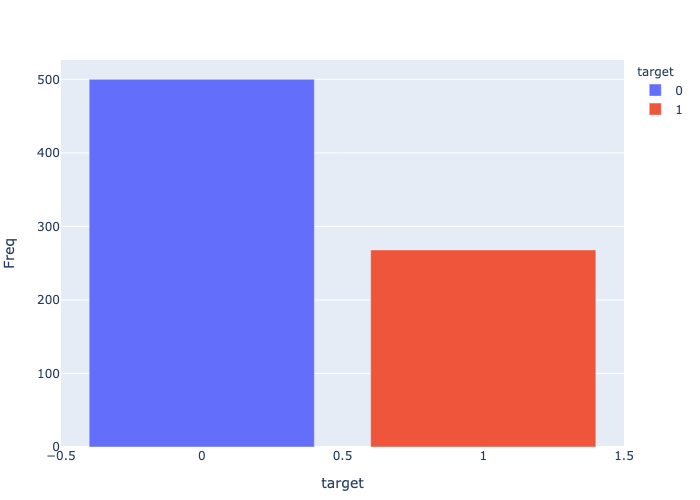

In [12]:
plot(plot_df, x=:target, y=:Freq, color=:target, kind="bar")

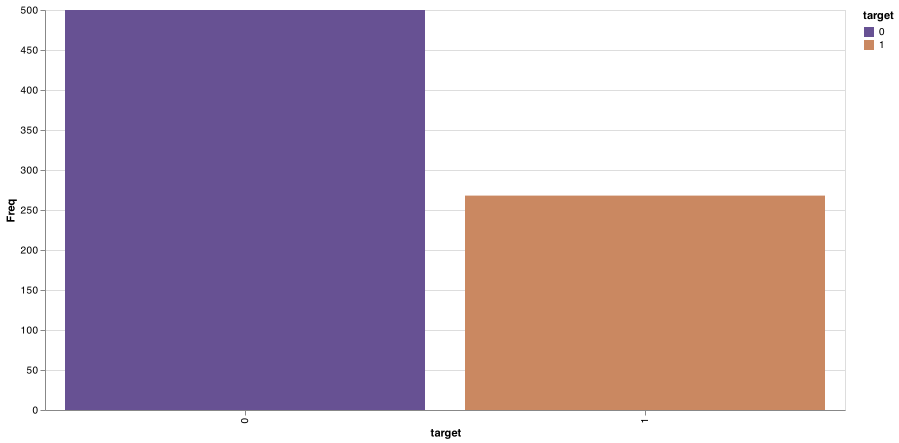

In [13]:
plot_df |>
@vlplot(:bar, 
        x="target:n", 
        y=:Freq, 
        width=800,
        height=400,
        color={"target:o", scale={range=["#675193", "#ca8861"]}})

In [14]:
feature_list = names(select(df, Not(target)))

9-element Vector{String}:
 "Pregnancies"
 "Glucose"
 "BloodPressure"
 "SkinThickness"
 "Insulin"
 "BMI"
 "DiabetesPedigreeFunction"
 "Age"
 "index"

In [15]:
plot_df = DataFrames.stack(select(df, feature_list), feature_list[1: end-1]);

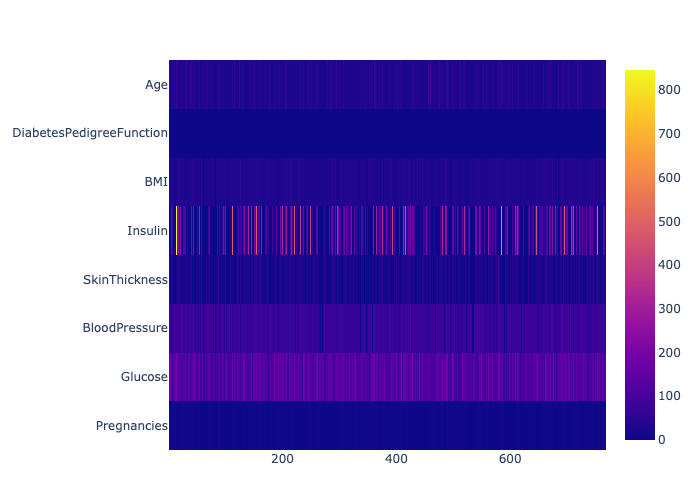

In [16]:
plot(heatmap(x=plot_df[!, "index"], y=plot_df[!, "variable"], z=plot_df[!, "value"]))

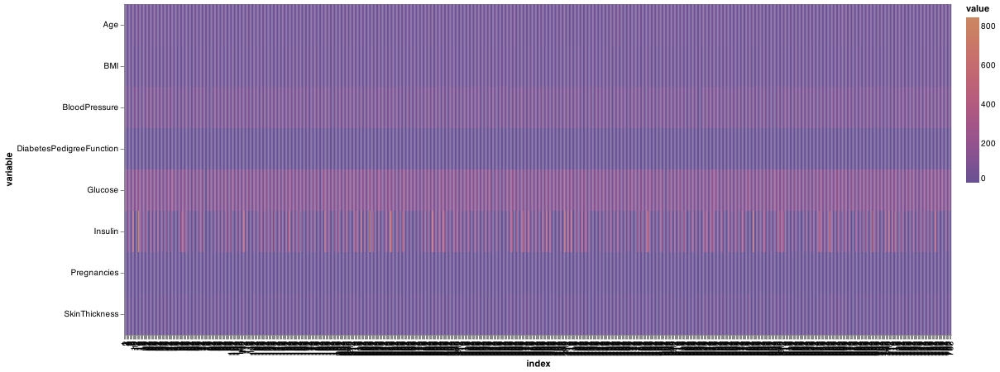

In [17]:
plot_df |>
@vlplot(:rect, 
        x="index:n", 
        y="variable:o", 
        # color=:value,
        width=1000,
        height=400,
        color={:value, scale={range=["#675193", "#ca8861"]}}
        )

In [18]:
function MinMaxScale(X)
    dt = fit(UnitRangeTransform, X, dims=1, unit=true)
    return StatsBase.transform(dt, X)
end;

In [19]:
scal_df = mapcols!(MinMaxScale, df[!, 1: end-2])
scal_df[!, "index"] = df[!, "index"];
plot_df = DataFrames.stack(select(scal_df, feature_list), feature_list[1: end-1]);
first(plot_df, 2)

Row,index,variable,value
,Int64,String,Float64
1,1,Pregnancies,0.352941
2,2,Pregnancies,0.0588235


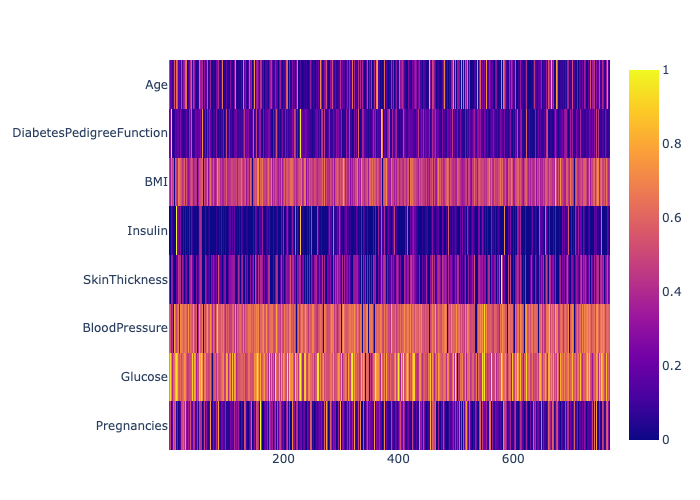

In [20]:
plot(heatmap(x=plot_df[!, "index"], y=plot_df[!, "variable"], z=plot_df[!, "value"]))

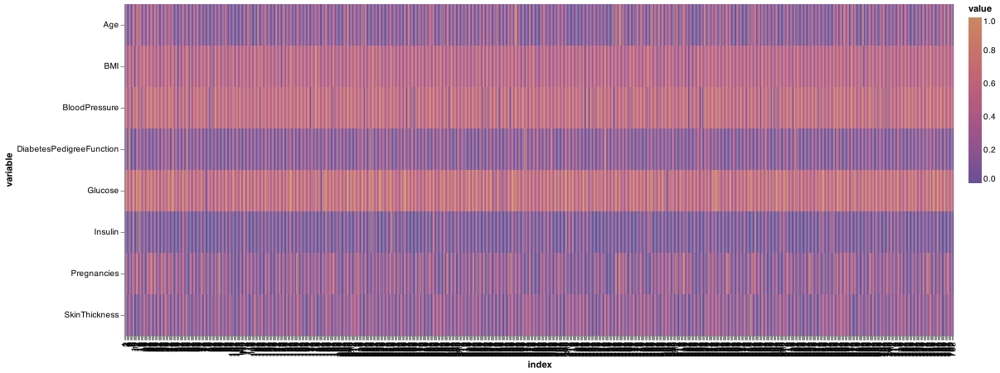

In [21]:
plot_df |>
@vlplot(mark=:rect, 
        x="index:n", 
        y="variable:o", 
        # color=:value,
        width=1000,
        height=400,
        color={:value, scale={range=["#675193", "#ca8861"]}}
        )

In [22]:
cor_df = DataFrame(Statistics.cor(Matrix(df[!, feature_list[1: end-2]])), feature_list[1: end-2])

Row,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction
,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,0.129459,0.141282,-0.0816718,-0.0735346,0.0176831,-0.0335227
2,0.129459,1.0,0.15259,0.0573279,0.331357,0.221071,0.137337
3,0.141282,0.15259,1.0,0.207371,0.0889334,0.281805,0.0412649
4,-0.0816718,0.0573279,0.207371,1.0,0.436783,0.392573,0.183928
5,-0.0735346,0.331357,0.0889334,0.436783,1.0,0.197859,0.185071
6,0.0176831,0.221071,0.281805,0.392573,0.197859,1.0,0.140647
7,-0.0335227,0.137337,0.0412649,0.183928,0.185071,0.140647,1.0


In [23]:
plot_df = DataFrames.stack(select(cor_df, feature_list[1: end-2]), feature_list[1: end-2])
plot_df[!, "variable2"] = repeat(feature_list[1: end-2], length(feature_list[1: end-2]));

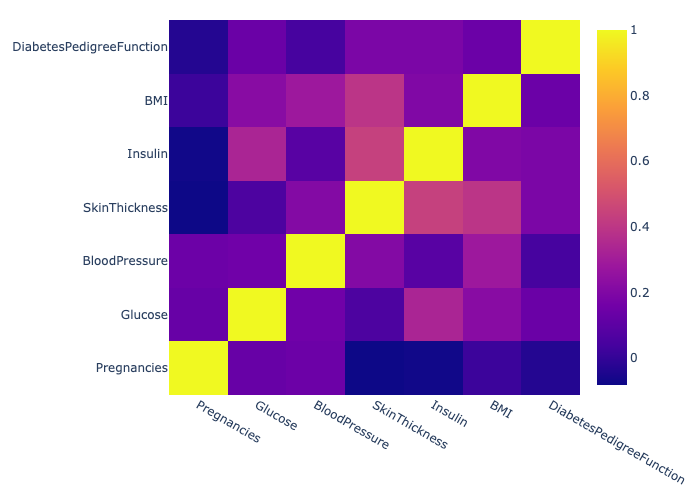

In [24]:
trace = heatmap(x=plot_df[!, "variable"], 
                y=plot_df[!, "variable2"], 
                z=plot_df[!, "value"])
layout = Layout(
                margin=attr(t=20, r=20,b=20,l=20),
                # xaxis=axis_template,
                # yaxis=axis_template,
                showlegend=false,
                width=700,
                height=500,
                autosize=false)
plot(trace, layout)

In [25]:
plot_df[!, "value"] = floor.(plot_df[!, "value"], sigdigits=2);

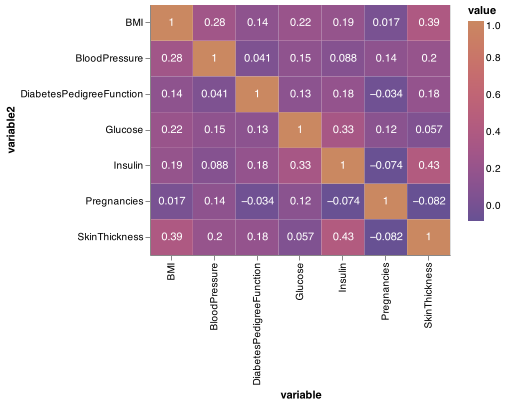

In [26]:
plot_df |>
@vlplot(x="variable:o", 
        y="variable2:o", 
        # color=:value,
        width=300,
        height=250
        ) +
@vlplot(:rect, color=:value, color={:value, scale={range=["#675193", "#ca8861"]}}) +
@vlplot(
        mark={:text,baseline="middle"},
        text=:value,
        color={
                value=:white
        },
        format=".2f"
        )

In [27]:
plot_df = DataFrames.stack(df, feature_list[1: end-1]);

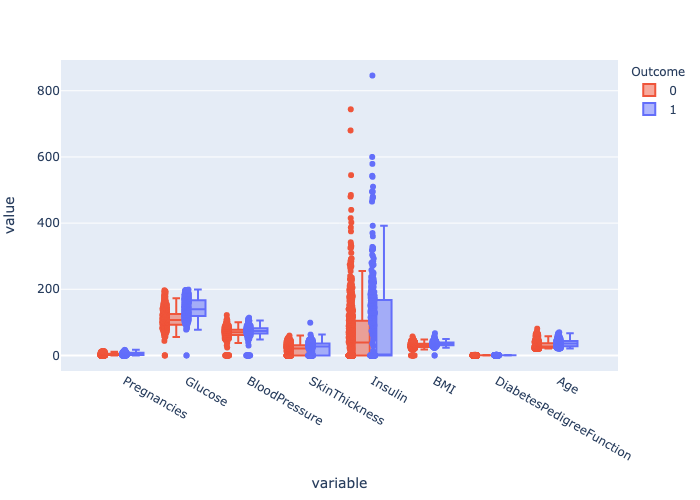

In [28]:
# plot(x=plot_df[!, "variable"], y=plot_df[!, "value"], kind="box")
plot(plot_df, x=:variable, y=:value, color=:Outcome, boxpoints="all", kind="box",Layout(boxmode="group"))

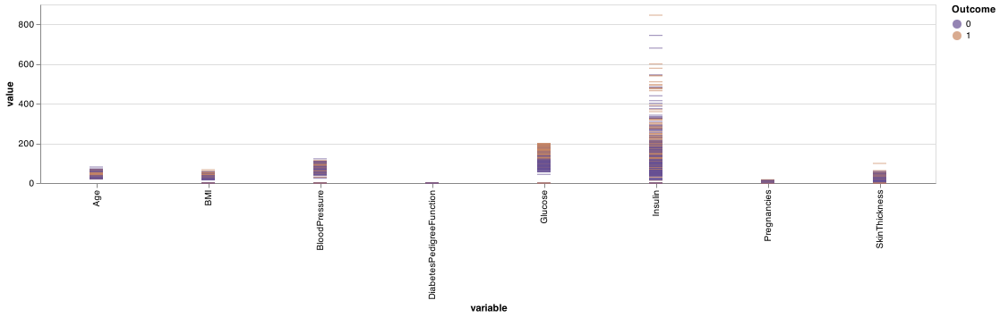

In [29]:
plot_df |>
@vlplot(
    mark=:tick,
    x="variable:o",
    y=:value,
    # color="Outcome:o",
    color={"Outcome:o", scale={range=["#675193", "#ca8861"]}},
    width=1000
)

### Looking at the scatter plots there seems like there may be some missing values with default value = 0, that need to be removed prior to analysis (e.g. BMI).

In [30]:
df = DataFrame(replace!(Matrix(df), 0=>NaN), names(df));

In [31]:
plot_df = DataFrames.stack(df, feature_list[1: end-1]);

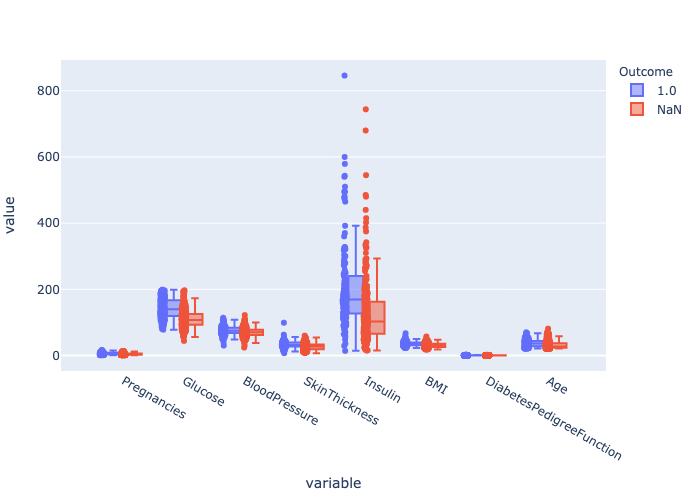

In [32]:
plot(plot_df, x=:variable, y=:value, color=:Outcome, boxpoints="all", kind="box",Layout(boxmode="group"))

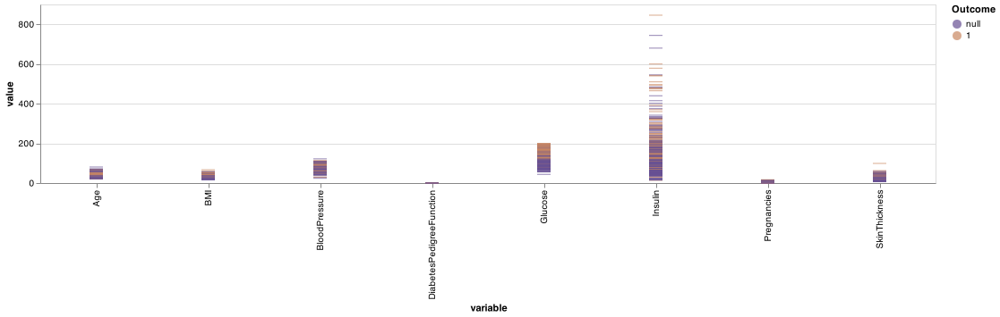

In [33]:
plot_df |>
@vlplot(
    mark=:tick,
    x="variable:o",
    y=:value,
    # color="Outcome:o",
    color={"Outcome:n", scale={range=["#675193", "#ca8861"]}},
    width=1000
)